In [1]:
import warnings
warnings.filterwarnings('ignore')

import scanpy as sc
import pandas as pd
import os
import anndata as ad
import scipy as sp

In [2]:
adata = sc.read_h5ad('../../results/nc_2021_Tabib/scrna.integrated.clustered.h5ad')
adata

AnnData object with n_obs × n_vars = 37547 × 15540
    obs: 'n_genes', 'sample', 'condition', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'cell_type_colors', 'condition_colors', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [4]:
'PECAM1' in adata.var_names

True

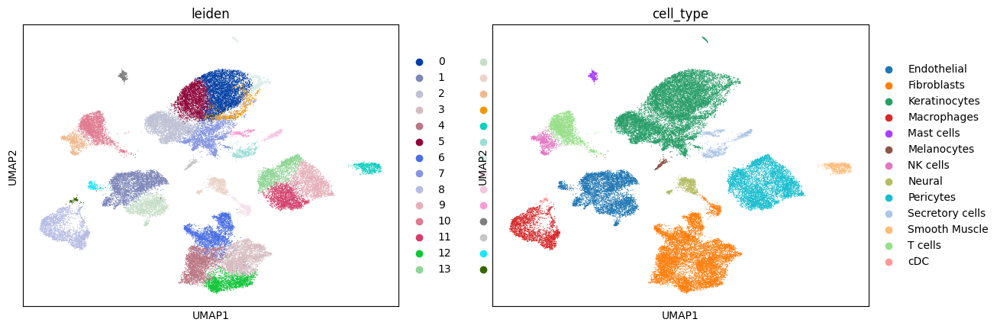

In [3]:
sc.pl.umap(adata, color=['leiden', 'cell_type'])

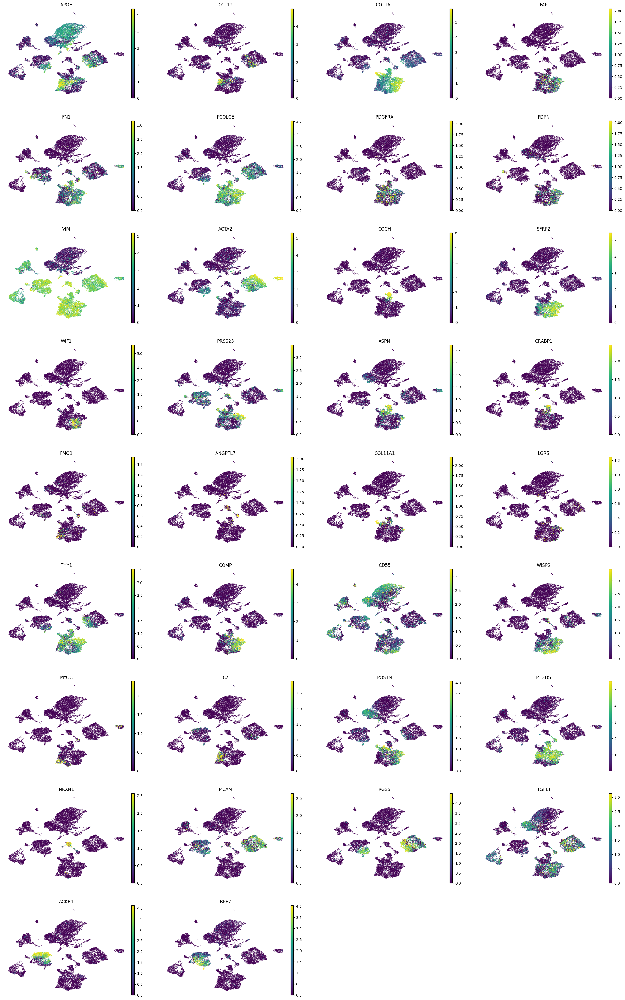

In [4]:
# fiboblast
sc.pl.umap(adata, color=['APOE', 'CCL19', 'COL1A1', 'FAP', 'FN1', 'PCOLCE', 'PDGFRA',
                        'PDPN', 'VIM', 'ACTA2', 'COCH',
                        'SFRP2', 'WIF1', 'PRSS23', 'ASPN', 'CRABP1',
                         'FMO1', 'ANGPTL7', 'COL11A1', 'LGR5', 'THY1', 'COMP',
                         'CD55', 'WISP2', 'MYOC', 'C7', 'POSTN', 'PTGDS', 'NRXN1', 
                         'MCAM', 'RGS5', 'TGFBI', 'ACKR1', 'RBP7'], vmax='p99.5', vmin='p0.5', frameon=False)

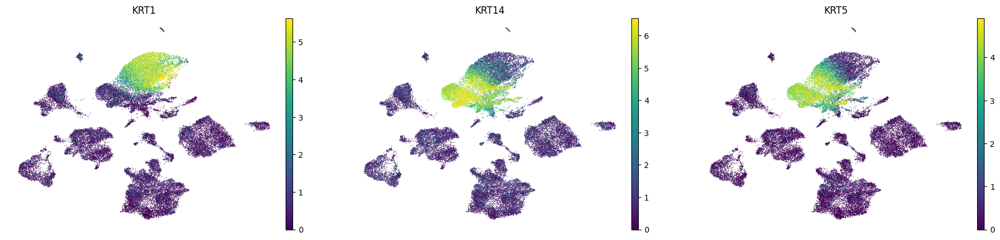

In [5]:
# Kerotinotye
sc.pl.umap(adata, color=['KRT1', 'KRT14', 'KRT5'], vmax='p99.5', vmin='p0.5', frameon=False)

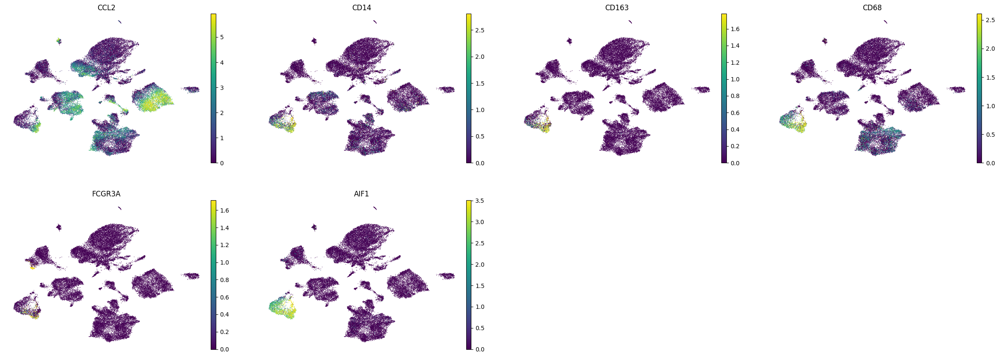

In [6]:
# Macrophage
sc.pl.umap(adata, color=['CCL2', 'CD14', 'CD163', 'CD68', 'FCGR3A', 'AIF1'], vmax='p99.5', vmin='p0.5', frameon=False)

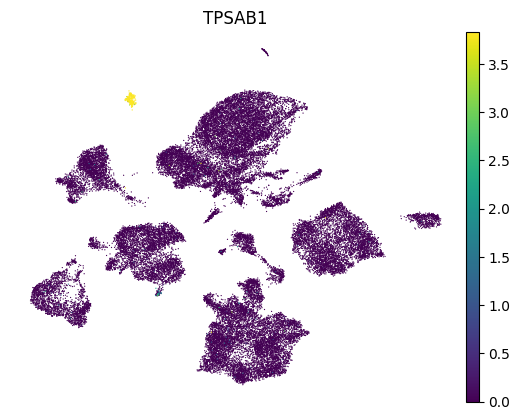

In [7]:
# Mast cell
sc.pl.umap(adata, color=['TPSAB1'], vmax='p99.5', vmin='p0.5', frameon=False)

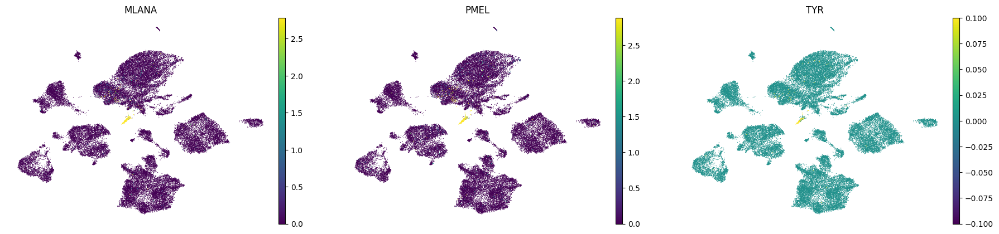

In [8]:
# Melanocyte
sc.pl.umap(adata, color=['MLANA', 'PMEL', 'TYR'], vmax='p99.5', vmin='p0.5', frameon=False)

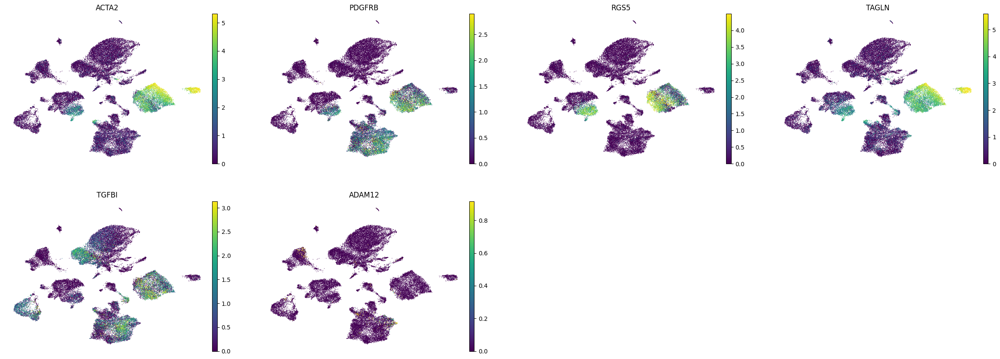

In [9]:
# pericyte
sc.pl.umap(adata, color=['ACTA2', 'PDGFRB', 'RGS5', 'TAGLN', 'TGFBI', 'ADAM12'], vmax='p99.5', vmin='p0.5', frameon=False)

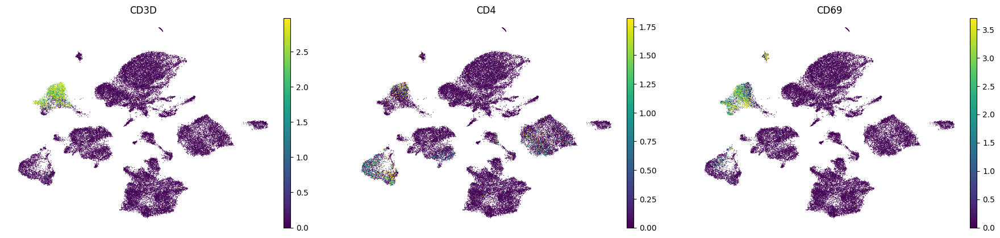

In [10]:
# T cell
sc.pl.umap(adata, color=['CD3D', 'CD4', 'CD69'], vmax='p99.5', vmin='p0.5', frameon=False)

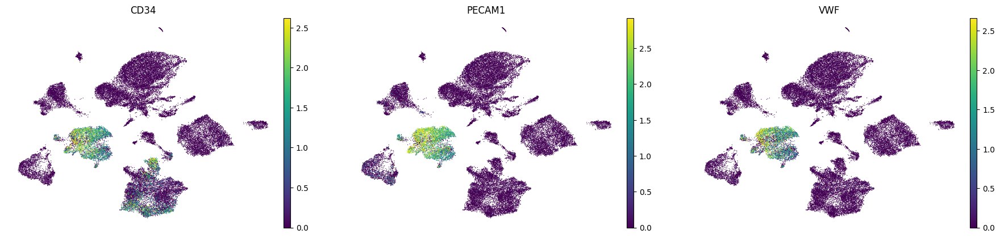

In [11]:
# endothelial cell
sc.pl.umap(adata, color=['CD34', 'PECAM1', 'VWF'], vmax='p99.5', vmin='p0.5', frameon=False)

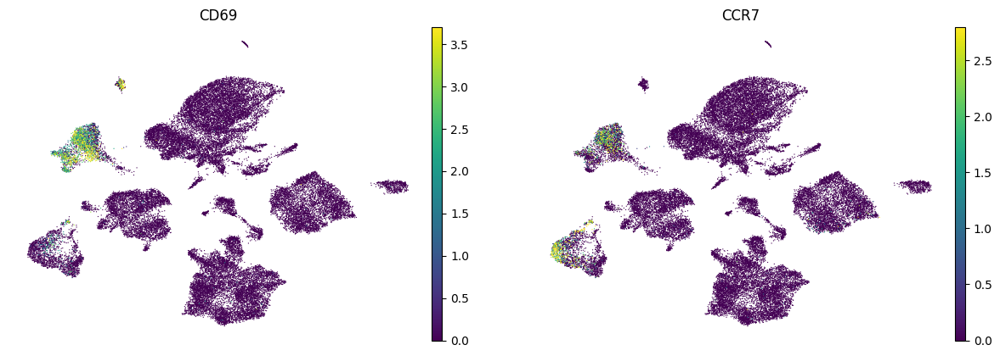

In [12]:
# NK cell
sc.pl.umap(adata, color=['CD69', 'CCR7'], vmax='p99.5', vmin='p0.5', frameon=False)

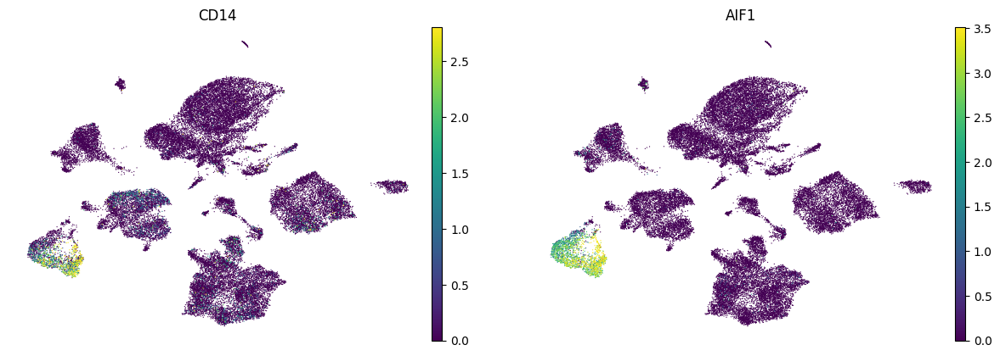

In [13]:
# monocyte
sc.pl.umap(adata, color=['CD14', 'AIF1'], vmax='p99.5', vmin='p0.5', frameon=False)

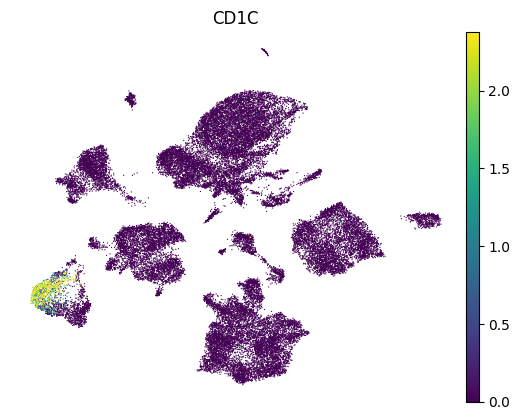

In [14]:
# cDC
sc.pl.umap(adata, color=['CD1C'], vmax='p99.5', vmin='p0.5', frameon=False)

In [15]:
# pDC
# sc.pl.umap(adata, color=['CD123', 'CD303', 'CD304'], vmax='p99.5', vmin='p0.5', frameon=False)
# no markers are found

In [16]:
# B cell
# sc.pl.umap(adata, color=['CD19', 'CD20', 'CD21'], vmax='p99.5', vmin='p0.5', frameon=False)
# no markers are found

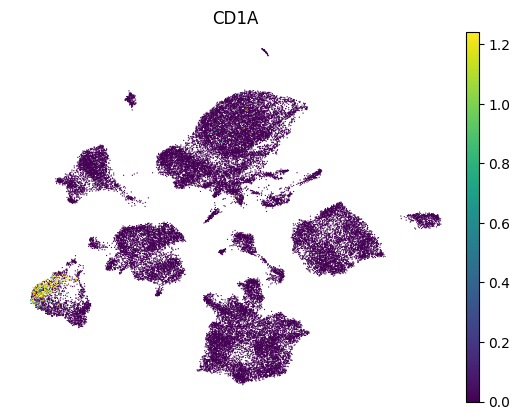

In [17]:
# Langerhans cell
sc.pl.umap(adata, color=['CD1A'], vmax='p99.5', vmin='p0.5', frameon=False)

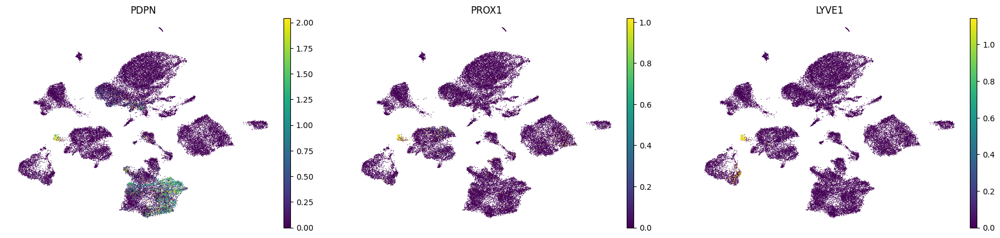

In [18]:
# Lymphatic endothelial cell
sc.pl.umap(adata, color=['PDPN', 'PROX1', 'LYVE1'], vmax='p99.5', vmin='p0.5', frameon=False)

In [19]:
# plasma cell
# sc.pl.umap(adata, color=['CD38', 'CD138'], vmax='p99.5', vmin='p0.5', frameon=False)
# no markers are found

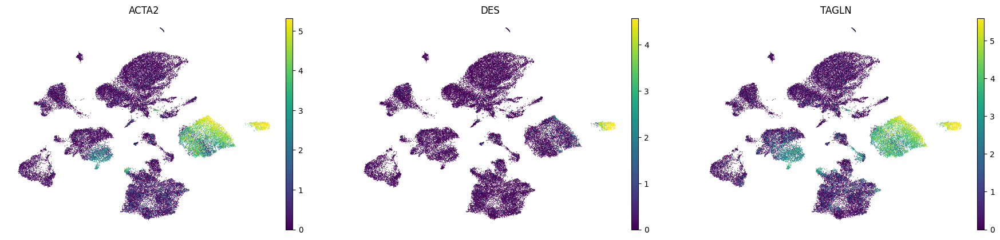

In [20]:
# Smooth muscle cell
sc.pl.umap(adata, color=['ACTA2', 'DES', 'TAGLN'], vmax='p99.5', vmin='p0.5', frameon=False)

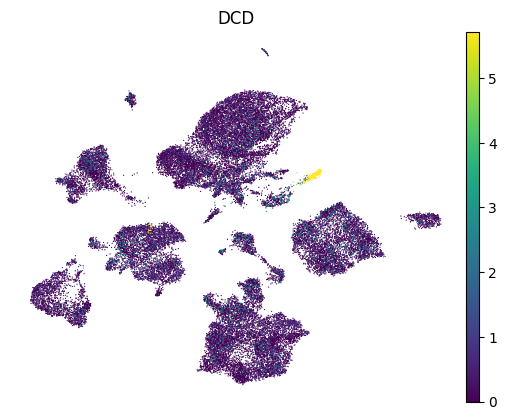

In [21]:
# secretory cell
sc.pl.umap(adata, color=['DCD'], vmax='p99.5', vmin='p0.5', frameon=False)

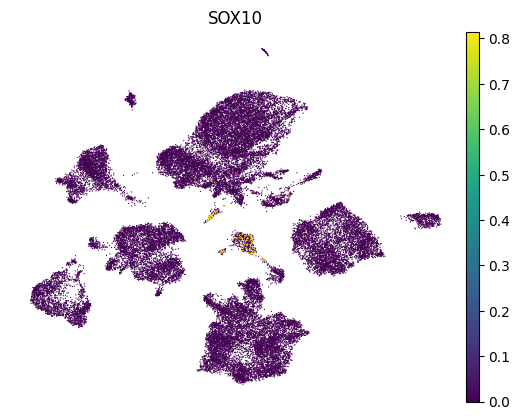

In [22]:
# neural cell
sc.pl.umap(adata, color=['SOX10'], vmax='p99.5', vmin='p0.5', frameon=False)

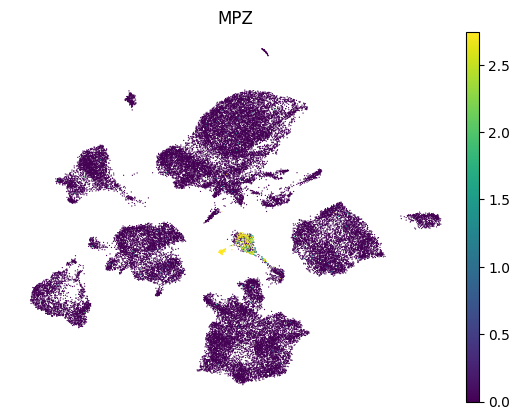

In [23]:
# Schwann cell
sc.pl.umap(adata, color=['MPZ'], vmax='p99.5', vmin='p0.5', frameon=False)

In [24]:
marker_genes = {'0-Terminal_Keratinocytes': ['KRT10', 'DMKN', 'KRTDAP', 'LYPD3', 'KRT2'],
                '1-Basal_Keratinocytes': ['KRT14','KRT15','S100A2','KRT5','DST'],
               '2-Endothelial_cells': ['FABP4','ACKR1','TM4SF1','IFI27','AQP1'],
               '3-SFRP2_Fibroblasts': ['SFRP2', 'COL1A1', 'COMP', 'COL3A1', 'COL1A2'],
               '4-KRT5_Keratinocytes': ['KRT17', 'S100A2', 'KRT5', 'KRT14', 'KRT15'],
               '5-STEAP4_Pericytes': ['RGS5', 'RGS16', 'CCL2', 'GEM', 'NDUFA4L2'],
               '6-RERGL_Pericytes': ['ACTA2', 'TAGLN', 'MYL9', 'RERGL', 'TPM2'],
               '7-T_NK_Cells': ['CXCR4', 'IL32','SRGN','CD52','DUSP2'],
               '8-MYOC_C7_Fibroblast': ['CFD','GSN','DCN','APOD','MGP'],
               '9-Macrophage/DC': ['CXCL8','HLA-DRA','HLA-DPB1','HLA-DRB1','CCL3'],
               '10-CCL19_C7_Fibroblast': ['CCL19','PTGDS','CXCL12','APOE','C1S'],
               '11-KRT6A_Keratinocyte': ['S100A8','KRT6A','KRT16','KRT5','KRT14'],
               '12-COL11A1_Fibroblast': ['COL1A1','COL1A2','POSTN','LUM','COL3A1'],
               '13-CA6_Secretory_Cell': ['AQP5','KRT19','GAPDH','SNORC','SLC12A2'],
               '14-Smooth_Muscle': ['DES','ACTG2','TPM2','MYLK','TAGLN'],
               '15-Neural': ['GPM6B','CRYAB','S100B','PLP1','PMP22'],
               '16-SCGB1B2P_Secretory': ['DCD','SCGB2A2','MUCL1','SCGB1B2P','PIP'],
               '17-CRABP1_ASPN_Fibroblast': ['COCH','ASPN','IGFBP5','MFAP4','PTGDS'],
               '18-Proliferating_cells': ['HMGB2','STMN1','PTTG1','HIST1H4C','UBE2C'],
               '19-Mast_cells': ['TPSAB1','TPSB2','CTSG','HPGD','FTH1'],
               '20-Melanocytes': ['TYRP1','PMEL','DCT','MLANA','QPCT'],
               '21-SCGB1D2_Secretory': ['CALML5','MMP7','KRT6B','KRT6A','WFDC3'],
               '22-KRT2_Keratinocytes': ['KRT2','CALML5','SLURP1','KRTDAP','SBSN'],
               '23-Lymphatic_Endothelial': ['CCL21','TFF3','CLDN5','MMRN1','ECSCR'],
               '24-Preadipocyte': ['MGST1','APOC1','APMAP','THRSP','KRT79'],
               '25-RAMP2_Endothelial': ['CLDN5','SLC9A3R2','RAMP2','IGFBP3','ICAM2'],
               '26-ANGPTL7_Fibroblasts': ['ANGPTL7','SFRP4','VIT','SCN7A','ABCA8'],
               '27-Cornified_envelope_Cells': ['LOR','SPRR2G','LCE1C','ASPRV1','SPRR2E'],
               '28-Schwann_cells': ['MPZ','MBP','S100B','PRX','PLP1'],
               '29-Plasma_cells': ['IGLC2','IGLC3','IGHG3','IGHG1']}

categories: 0, 1, 2, etc.
var_group_labels: 0-Terminal_Keratinocytes, 1-Basal_Keratinocytes, 2-Endothelial_cells, etc.


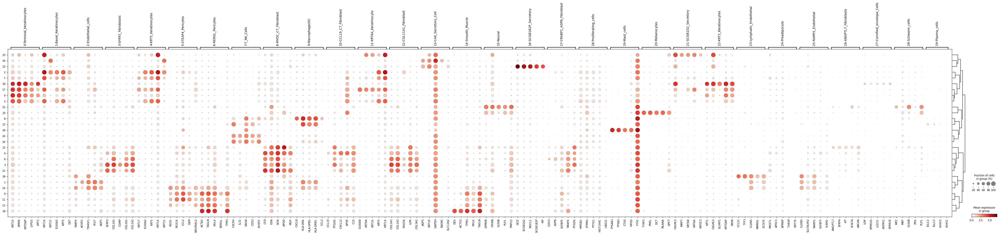

In [25]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden', dendrogram=True)